In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from wordcloud import WordCloud

In [2]:
import nltk
import os
path=os.chdir("C:\\Users\\kumar\\OneDrive\\Desktop\\Machine Learning\\Genre Classification Dataset")

In [3]:
nltk.data.path.append(path)

In [4]:
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\kumar\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kumar\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\kumar\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [5]:
import warnings
warnings.filterwarnings("ignore")

In [6]:
train_data = pd.read_csv("C:\\Users\\kumar\\OneDrive\\Desktop\\Machine Learning\\Genre Classification Dataset\\train_data.txt", delimiter=':::' ,header = None ,engine='python')
test_data  = pd.read_csv("C:\\Users\\kumar\\OneDrive\\Desktop\\Machine Learning\\Genre Classification Dataset\\test_data.txt", delimiter=':::' ,header = None ,engine='python')
test_data_solution  = pd.read_csv("C:\\Users\\kumar\\OneDrive\\Desktop\\Machine Learning\\Genre Classification Dataset\\test_data_solution.txt", delimiter=':::' ,header = None ,engine='python')

In [7]:
print("shape",train_data.shape)
train_data.head()

shape (54214, 4)


,0,1,2,3
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [8]:
print("shape",test_data_solution.shape)
test_data_solution.head()

shape (54200, 4)


,0,1,2,3
0,1,Edgar's Lunch (1998),thriller,"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),comedy,"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),documentary,One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),drama,"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),drama,Before he was known internationally as a mart...


In [9]:
df = pd.concat((train_data ,test_data_solution))
df.columns = ["id" ,"Title","Genre","Description"]
df.head()

,id,Title,Genre,Description
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [10]:
df.shape

(108414, 4)

In [11]:
df.duplicated().sum() 
df.drop_duplicates(inplace = True)

In [12]:
df.isna().sum()
df.dropna( inplace = True )
df.shape

(108414, 4)

In [13]:
stopword = set(stopwords.words('english'))
def preprocessing(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'[#@\$]', '', text)
    tokens = word_tokenize(text)
    lemmatizer  = WordNetLemmatizer()
    text = text.split()
    text = [word for word in text if word not in stopword]
    return " ".join(text) 

In [14]:
df["Despcription_clean"] =  df["Description"].apply(preprocessing)
df.head()

,id,Title,Genre,Description,Despcription_clean
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


In [15]:
df["Genre"].value_counts()

 drama           27225
 documentary     26192
 comedy          14893
 short           10145
 horror           4408
 thriller         3181
 action           2629
 western          2064
 reality-tv       1767
 family           1567
 adventure        1550
 music            1462
 romance          1344
 sci-fi           1293
 adult            1180
 crime            1010
 animation         996
 sport             863
 talk-show         782
 fantasy           645
 mystery           637
 musical           553
 biography         529
 history           486
 game-show         387
 news              362
 war               264
Name: Genre, dtype: int64

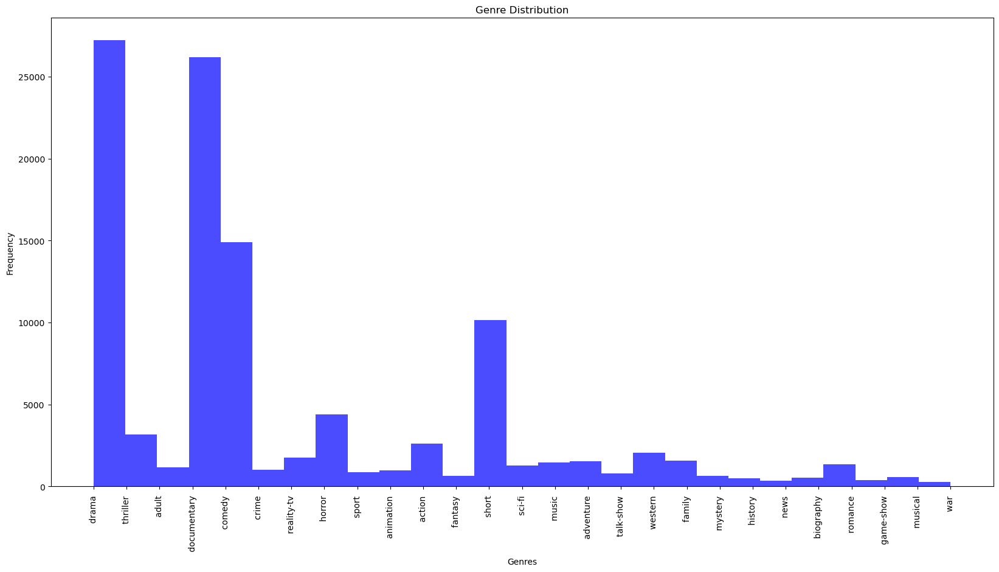

In [16]:
plt.figure(figsize=(20, 10))
plt.hist(df["Genre"],bins =27 , color='blue', alpha=0.7)
plt.title("Genre Distribution")
plt.xlabel("Genres")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

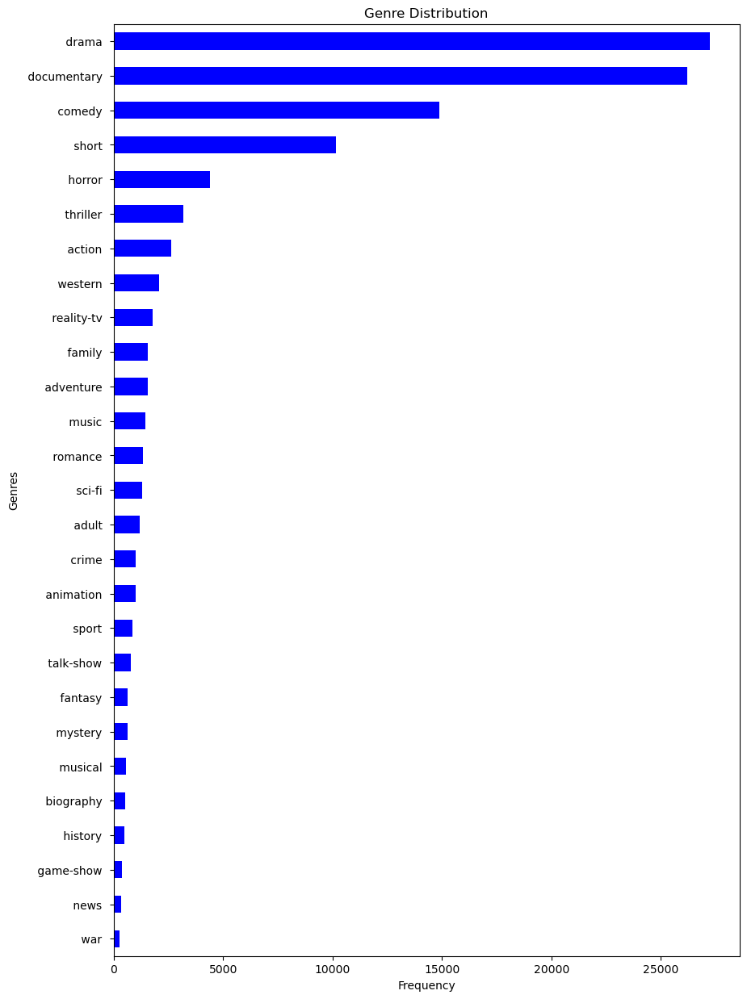

In [17]:
genre_counts = df["Genre"].value_counts()
sorted_genres = genre_counts.sort_values(ascending=True)
plt.figure(figsize=(10, 15))
sorted_genres.plot(kind='barh',color = "blue", alpha=1 )
plt.title("Genre Distribution")
plt.xlabel("Frequency")
plt.ylabel("Genres")
plt.show()

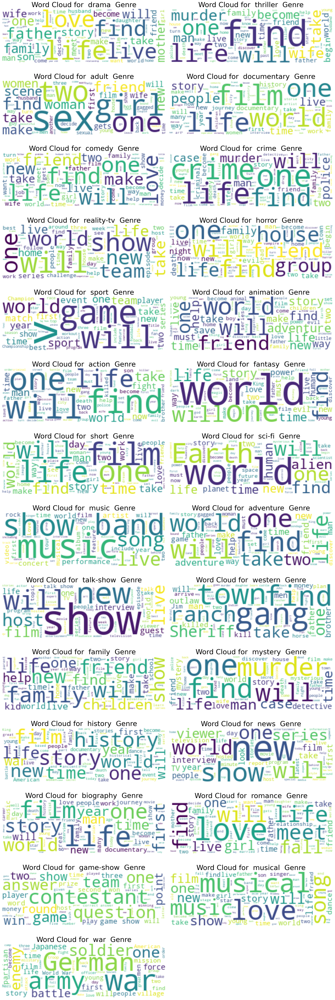

In [18]:
genres = df['Genre'].unique()
plt.figure(figsize=(20, 60))
for i, genre in enumerate(genres, 1):
    plt.subplot(14, 2, i) 
    text_subset = " ".join(list(df[df["Genre"] == genre]['Description']))
    wordcloud = WordCloud(max_words=300, width=300, height=100, background_color='white').generate(text_subset)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {genre} Genre',fontsize=30)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [19]:
data = df.drop(["Title","id"] , axis = 1) 
data.head()

,Genre,Description,Despcription_clean
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


In [20]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier 
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay

In [21]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data['Genre_encoded'] = label_encoder.fit_transform(data['Genre'])
data['Genre_encoded']

0         8
1        24
2         1
3         8
4         8
         ..
54195    13
54196    26
54197     1
54198     8
54199     8
Name: Genre_encoded, Length: 108414, dtype: int32

In [22]:
class_names= list(label_encoder.classes_)
class_names  

[' action ',
 ' adult ',
 ' adventure ',
 ' animation ',
 ' biography ',
 ' comedy ',
 ' crime ',
 ' documentary ',
 ' drama ',
 ' family ',
 ' fantasy ',
 ' game-show ',
 ' history ',
 ' horror ',
 ' music ',
 ' musical ',
 ' mystery ',
 ' news ',
 ' reality-tv ',
 ' romance ',
 ' sci-fi ',
 ' short ',
 ' sport ',
 ' talk-show ',
 ' thriller ',
 ' war ',
 ' western ']

In [23]:
data.head()

,Genre,Description,Despcription_clean,Genre_encoded
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...,8
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...,24
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...,1
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...,8
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...,8


In [24]:
x = data["Despcription_clean"]
y = data["Genre"]
x_train ,x_test ,y_train ,y_test = train_test_split(x ,y ,test_size = 0.5)

In [25]:
vectorize = CountVectorizer()
x_train1 = vectorize.fit_transform(x_train)
x_test1 =  vectorize.transform(x_test)

Model Score on Training data 0.639308576383124
Model Score on Training data 0.5250982345453539
               precision    recall  f1-score   support

      action        0.04      0.59      0.07        88
       adult        0.01      0.67      0.02         9
   adventure        0.07      0.50      0.13       110
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         4
      comedy        0.44      0.54      0.49      6159
       crime        0.00      0.00      0.00         1
 documentary        0.90      0.57      0.70     20745
       drama        0.83      0.46      0.59     24660
      family        0.00      0.00      0.00         2
     fantasy        0.00      0.00      0.00        10
   game-show        0.15      0.97      0.27        31
     history        0.00      0.00      0.00         0
      horror        0.25      0.78      0.38       735
       music        0.06      0.98      0.11        45
     musical        0.01

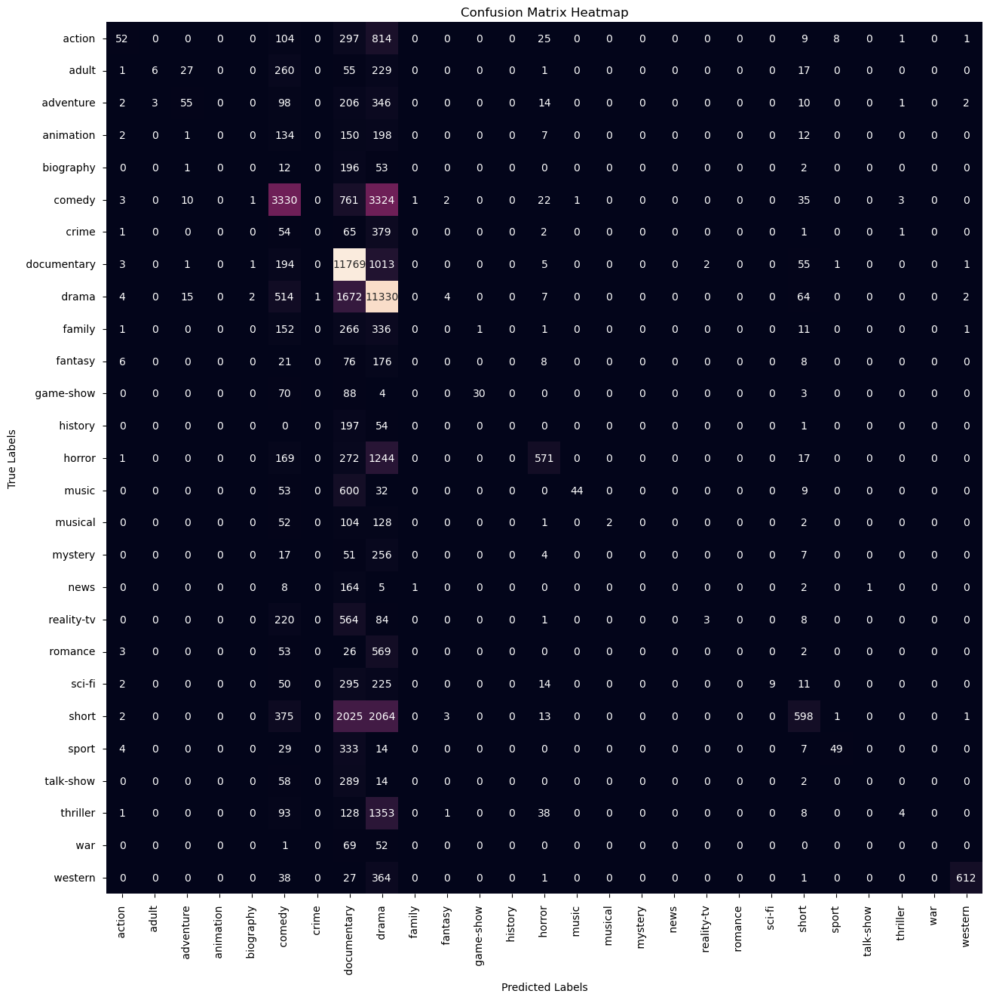

In [26]:
mnb = MultinomialNB()
mnb.fit(x_train1 ,y_train)
print("Model Score on Training data",mnb.score(x_train1 ,y_train))
print("Model Score on Training data",mnb.score(x_test1 ,y_test))
y_pred = mnb.predict(x_test1)
print(classification_report(y_pred ,y_test))
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(15, 15))
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names) 
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()    

In [27]:
model = LogisticRegression()
model.fit(x_train1 ,y_train)
print("Model Score on Training data",model.score(x_train1 ,y_train))
print("Model Score on Training data",model.score(x_test1 ,y_test))
y_pred = model.predict(x_test1)
print(classification_report(y_pred ,y_test))

Model Score on Training data 0.9958861401663992
Model Score on Training data 0.5688379729555223
               precision    recall  f1-score   support

      action        0.34      0.41      0.37      1095
       adult        0.35      0.62      0.45       341
   adventure        0.27      0.41      0.33       487
   animation        0.16      0.39      0.23       204
   biography        0.02      0.21      0.03        24
      comedy        0.58      0.54      0.56      7981
       crime        0.08      0.22      0.12       185
 documentary        0.78      0.70      0.74     14469
       drama        0.69      0.56      0.62     16599
      family        0.19      0.31      0.24       469
     fantasy        0.09      0.28      0.14        97
   game-show        0.63      0.78      0.70       156
     history        0.02      0.14      0.03        29
      horror        0.57      0.64      0.60      2045
       music        0.49      0.65      0.56       559
     musical        0.0

In [28]:
cm = confusion_matrix(y_test, y_pred)

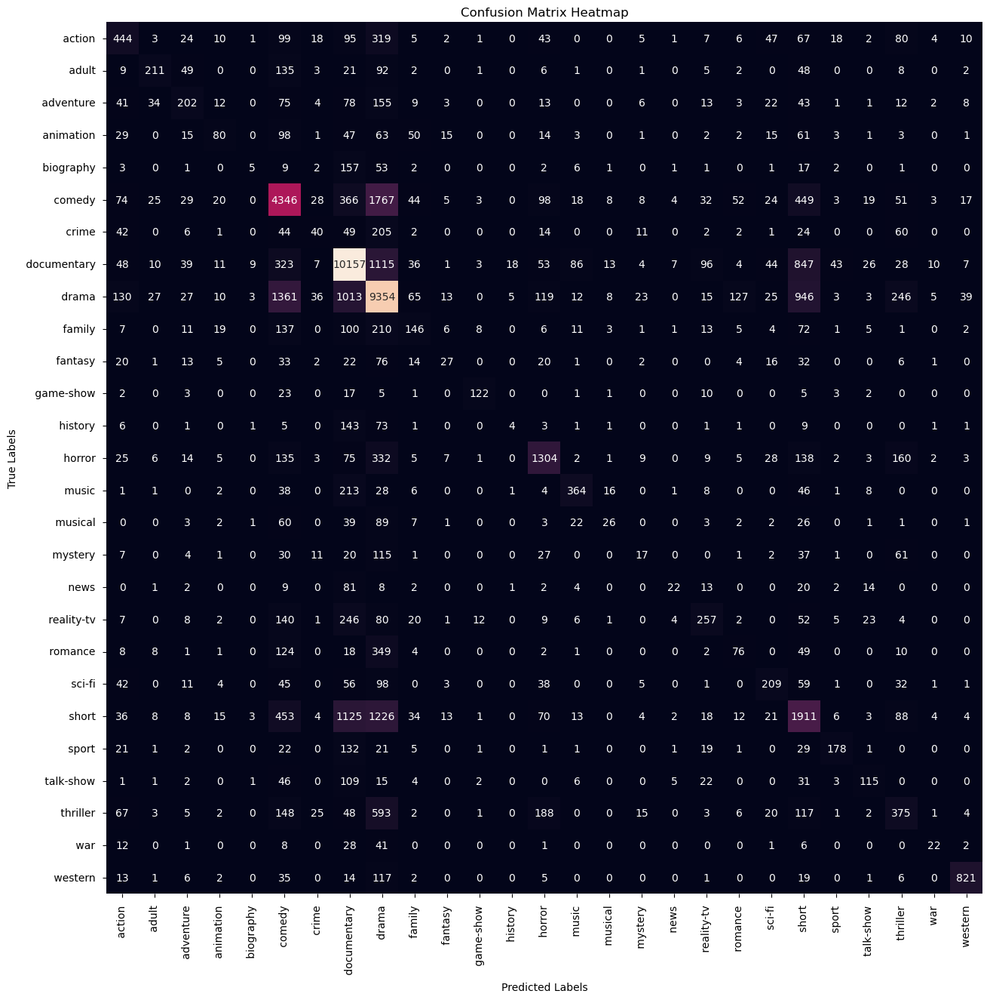

In [29]:
plt.figure(figsize=(15, 15))
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [30]:
svm = LinearSVC()
svm.fit(x_train1 ,y_train)
print("Model Score on Training data",svm.score(x_train1 ,y_train))
print("Model Score on Training data",svm.score(x_test1 ,y_test))
y_pred = svm.predict(x_test1)
print(classification_report(y_pred ,y_test))

Model Score on Training data 0.9995757005552789
Model Score on Training data 0.5185123692512037
               precision    recall  f1-score   support

      action        0.30      0.32      0.31      1203
       adult        0.38      0.49      0.43       463
   adventure        0.26      0.31      0.28       612
   animation        0.13      0.22      0.16       292
   biography        0.04      0.07      0.05       136
      comedy        0.52      0.51      0.51      7656
       crime        0.08      0.12      0.10       331
 documentary        0.72      0.69      0.70     13628
       drama        0.60      0.54      0.57     15151
      family        0.19      0.23      0.20       631
     fantasy        0.09      0.14      0.11       198
   game-show        0.62      0.71      0.66       168
     history        0.02      0.06      0.03        83
      horror        0.55      0.56      0.55      2232
       music        0.51      0.56      0.53       672
     musical        0.0

In [31]:
cm = confusion_matrix(y_test, y_pred)

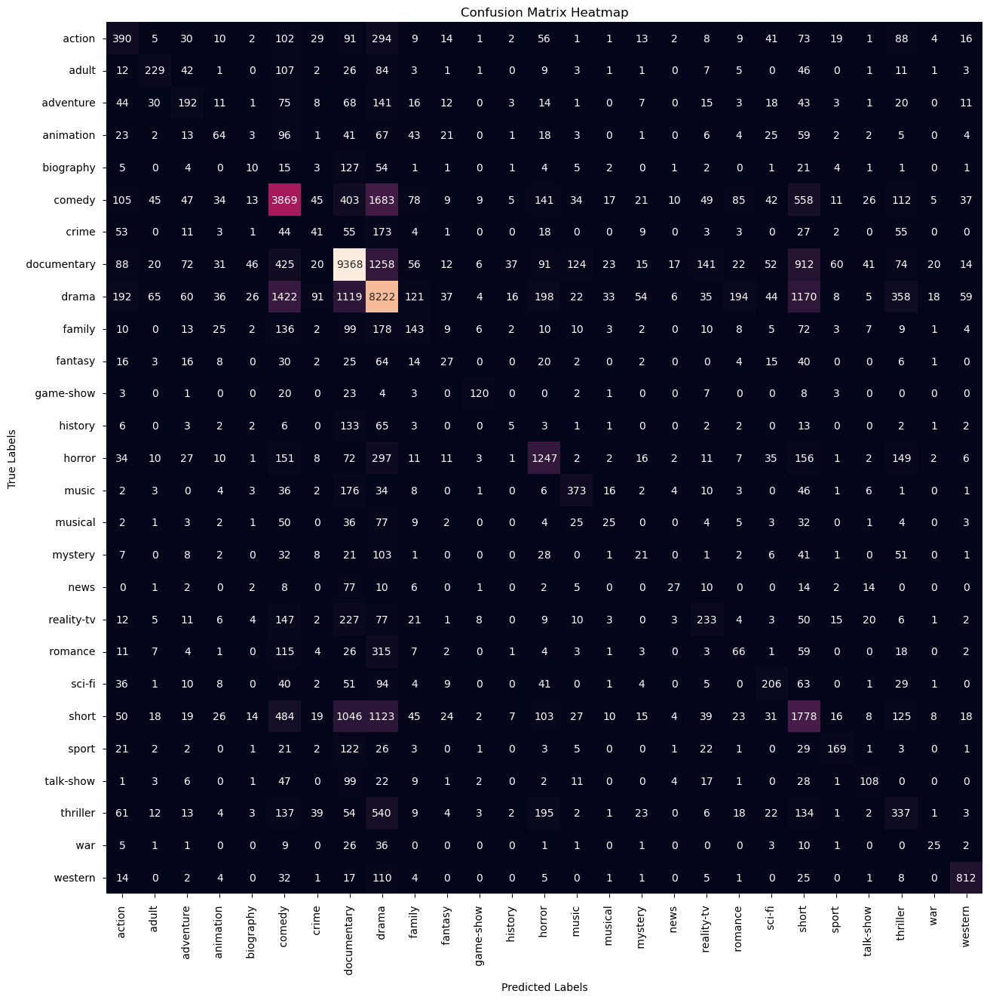

In [32]:
plt.figure(figsize=(15, 15)) 
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [33]:
random_forest = RandomForestClassifier()

In [35]:
random_forest.fit(x_train1, y_train)
print("Random Forest - Train Score:",random_forest.score(x_train1, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test1, y_test))

Random Forest - Train Score: 0.9995757005552789
Random Forest - Test Score: 0.4878890180235025


In [36]:
y_pred = random_forest.predict(x_test1)
print(classification_report(y_pred ,y_test))

               precision    recall  f1-score   support

      action        0.01      0.75      0.02        20
       adult        0.05      0.74      0.10        43
   adventure        0.11      0.74      0.20       114
   animation        0.00      0.00      0.00         1
   biography        0.00      0.00      0.00         0
      comedy        0.24      0.56      0.34      3292
       crime        0.00      1.00      0.01         2
 documentary        0.89      0.56      0.69     20651
       drama        0.86      0.41      0.55     28544
      family        0.03      0.77      0.05        26
     fantasy        0.00      0.00      0.00         4
   game-show        0.43      0.87      0.57        95
     history        0.00      0.00      0.00         1
      horror        0.10      0.78      0.18       292
       music        0.10      0.90      0.17        79
     musical        0.01      1.00      0.03         4
     mystery        0.00      1.00      0.01         1
        n

In [37]:
cm = confusion_matrix(y_test, y_pred)

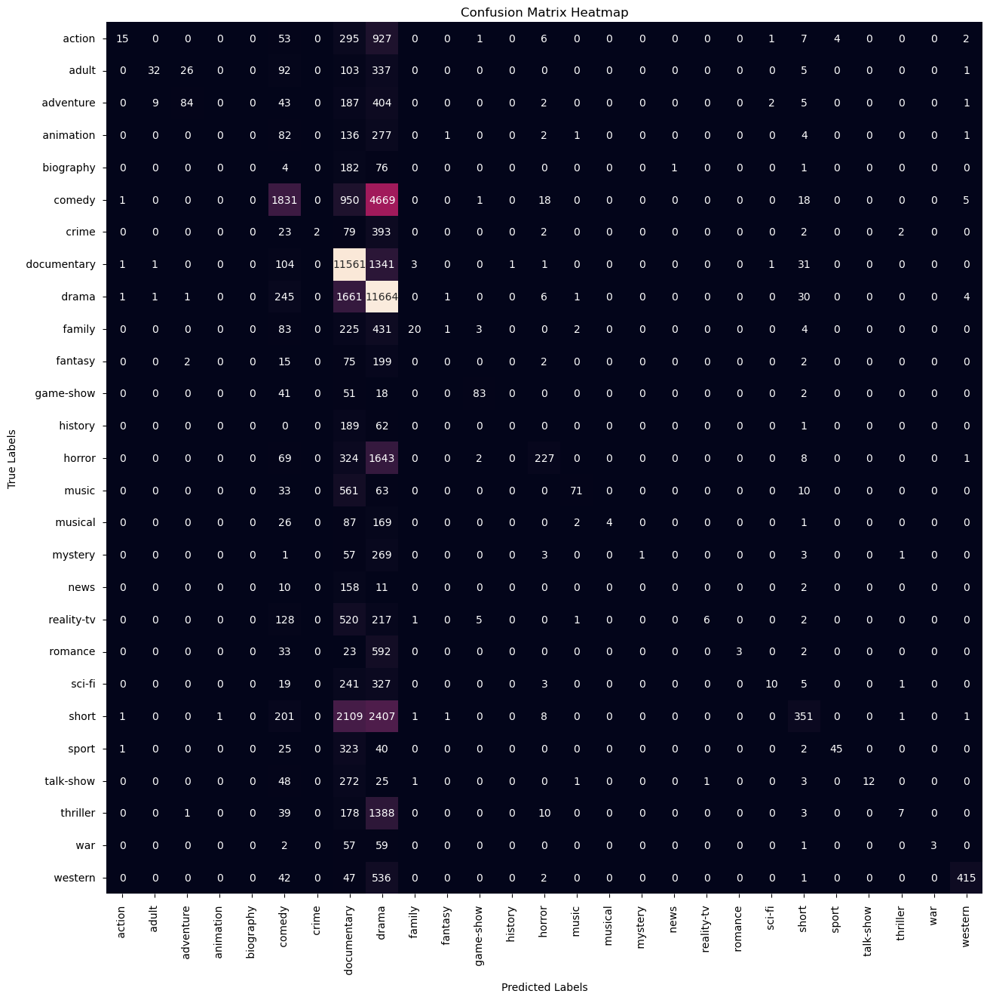

In [38]:
plt.figure(figsize=(15, 15))  
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [39]:
vectorize = CountVectorizer()
x_train2 = vectorize.fit_transform(x_train)
x_test2=  vectorize.transform(x_test)

In [40]:
mnb = MultinomialNB()
mnb.fit(x_train1 ,y_train)
print("Model Score on Training data",mnb.score(x_train1 ,y_train))
print("Model Score on Training data",mnb.score(x_test1,y_test))
y_pred = mnb.predict(x_test1)
print(classification_report(y_pred ,y_test))

Model Score on Training data 0.639308576383124
Model Score on Training data 0.5250982345453539
               precision    recall  f1-score   support

      action        0.04      0.59      0.07        88
       adult        0.01      0.67      0.02         9
   adventure        0.07      0.50      0.13       110
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         4
      comedy        0.44      0.54      0.49      6159
       crime        0.00      0.00      0.00         1
 documentary        0.90      0.57      0.70     20745
       drama        0.83      0.46      0.59     24660
      family        0.00      0.00      0.00         2
     fantasy        0.00      0.00      0.00        10
   game-show        0.15      0.97      0.27        31
     history        0.00      0.00      0.00         0
      horror        0.25      0.78      0.38       735
       music        0.06      0.98      0.11        45
     musical        0.01

In [41]:
cm = confusion_matrix(y_test, y_pred)

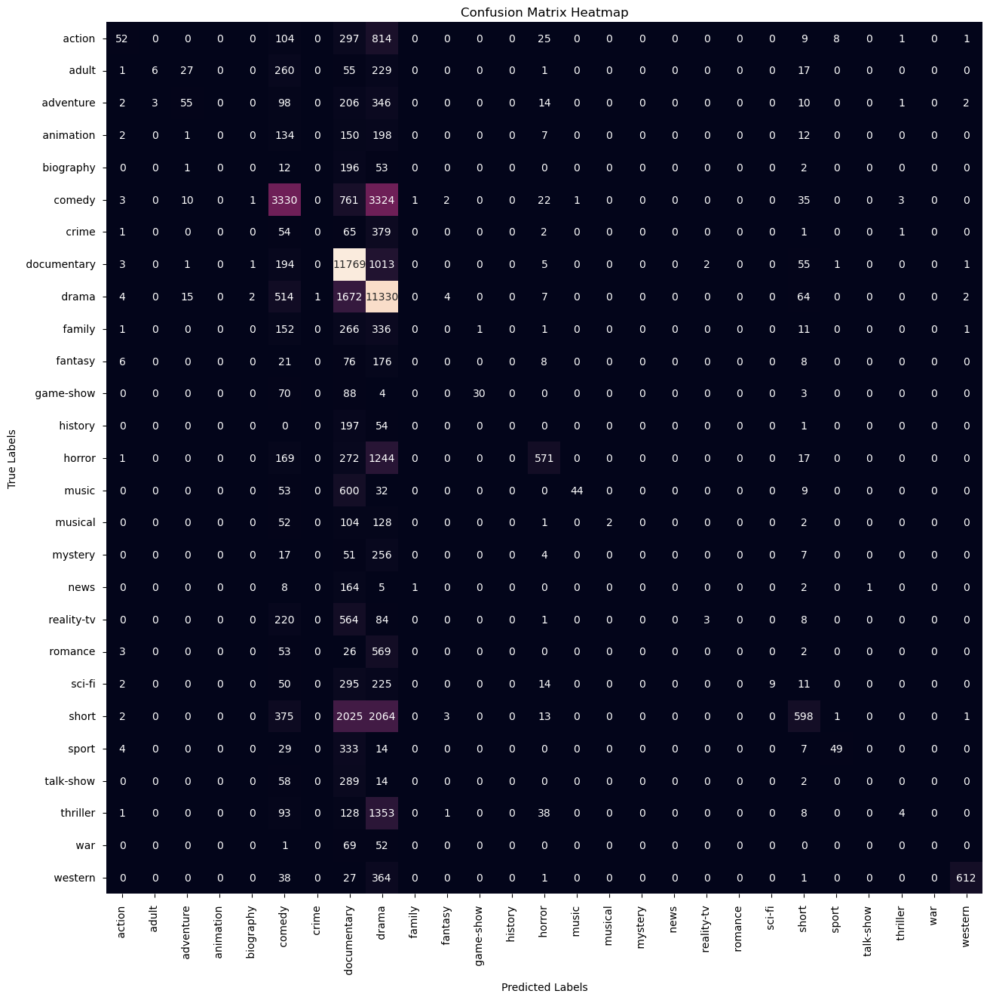

In [42]:
plt.figure(figsize=(15, 15))  
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [43]:
model = LogisticRegression()
model.fit(x_train2 ,y_train)
print("Model Score on Training data",model.score(x_train2 ,y_train))
print("Model Score on Training data",model.score(x_test2 ,y_test))
y_pred = model.predict(x_test2)
print(classification_report(y_pred ,y_test))

Model Score on Training data 0.9958861401663992
Model Score on Training data 0.5688379729555223
               precision    recall  f1-score   support

      action        0.34      0.41      0.37      1095
       adult        0.35      0.62      0.45       341
   adventure        0.27      0.41      0.33       487
   animation        0.16      0.39      0.23       204
   biography        0.02      0.21      0.03        24
      comedy        0.58      0.54      0.56      7981
       crime        0.08      0.22      0.12       185
 documentary        0.78      0.70      0.74     14469
       drama        0.69      0.56      0.62     16599
      family        0.19      0.31      0.24       469
     fantasy        0.09      0.28      0.14        97
   game-show        0.63      0.78      0.70       156
     history        0.02      0.14      0.03        29
      horror        0.57      0.64      0.60      2045
       music        0.49      0.65      0.56       559
     musical        0.0

In [44]:
cm = confusion_matrix(y_test, y_pred)

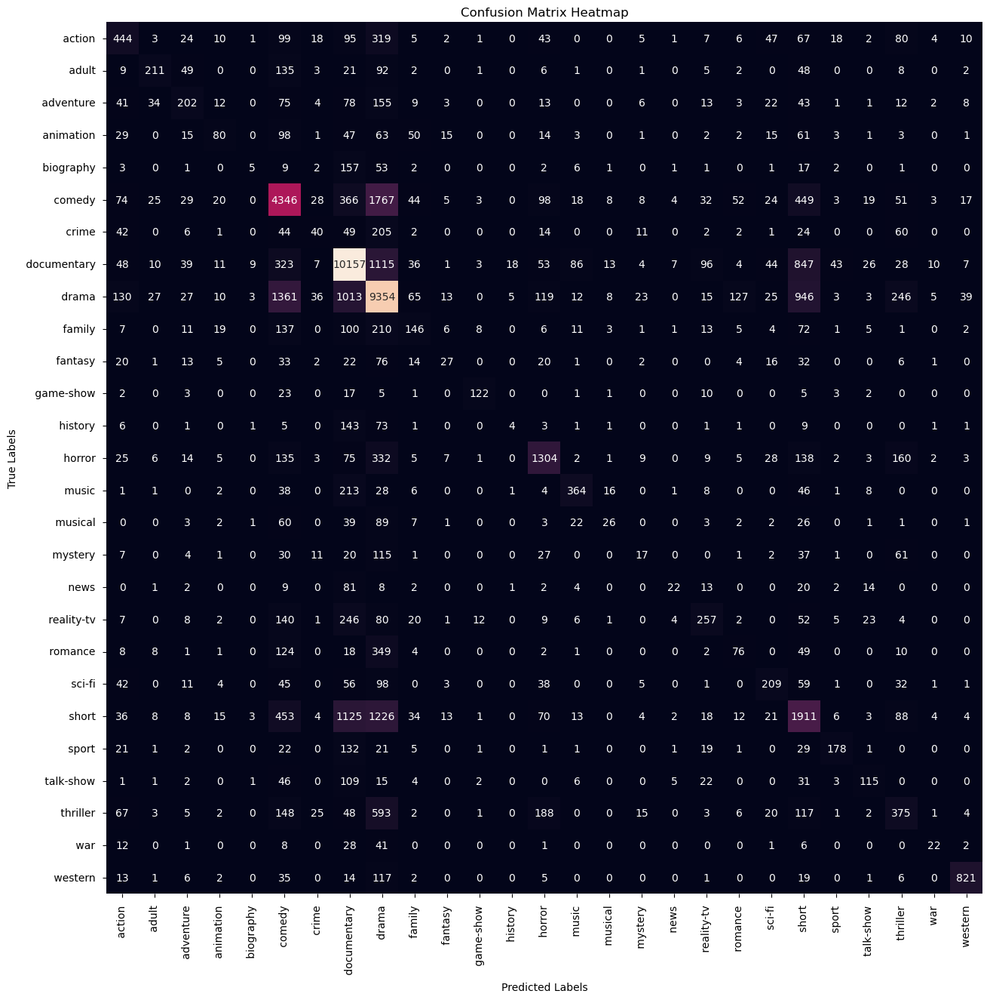

In [45]:
plt.figure(figsize=(15, 15)) 
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [46]:
svm = LinearSVC()
svm.fit(x_train2 ,y_train)
print("Model Score on Training data",svm.score(x_train2 ,y_train))
print("Model Score on Training data",svm.score(x_test2 ,y_test))
y_pred = svm.predict(x_test2)
print(classification_report(y_pred ,y_test))

Model Score on Training data 0.9995757005552789
Model Score on Training data 0.5185492648550926
               precision    recall  f1-score   support

      action        0.30      0.32      0.31      1206
       adult        0.38      0.49      0.43       463
   adventure        0.26      0.31      0.28       612
   animation        0.13      0.22      0.16       292
   biography        0.04      0.07      0.05       136
      comedy        0.52      0.51      0.51      7653
       crime        0.08      0.12      0.10       331
 documentary        0.72      0.69      0.70     13635
       drama        0.60      0.54      0.57     15144
      family        0.19      0.23      0.20       630
     fantasy        0.09      0.14      0.11       199
   game-show        0.62      0.71      0.66       168
     history        0.02      0.06      0.03        83
      horror        0.55      0.56      0.55      2232
       music        0.51      0.56      0.53       672
     musical        0.0

In [47]:
cm = confusion_matrix(y_test, y_pred)

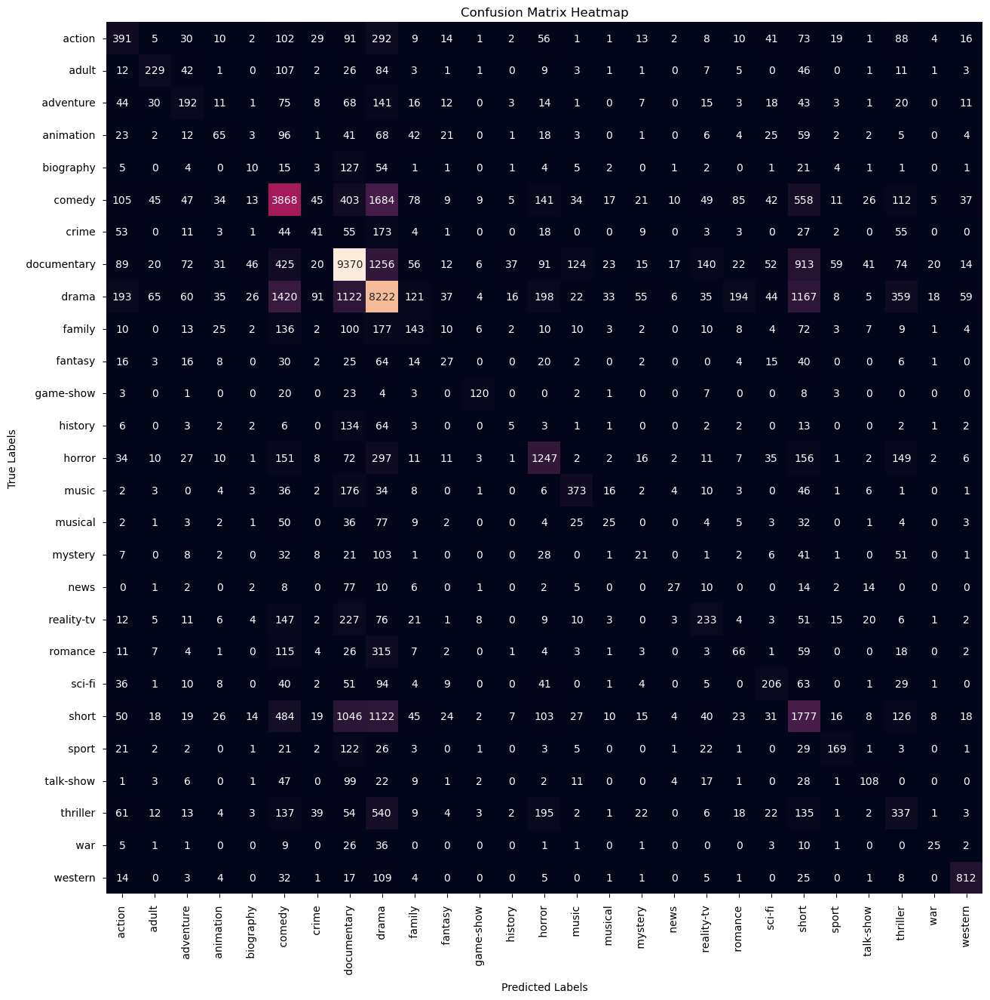

In [48]:
plt.figure(figsize=(15, 15))  
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [49]:
random_forest = RandomForestClassifier()
random_forest.fit(x_train2, y_train)

print("Random Forest - Train Score:",random_forest.score(x_train2, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test2, y_test))

Random Forest - Train Score: 0.9995757005552789
Random Forest - Test Score: 0.4860626856310071


In [50]:
y_pred = random_forest.predict(x_test2)
print(classification_report(y_pred ,y_test))

               precision    recall  f1-score   support

      action        0.01      0.83      0.02        18
       adult        0.05      0.68      0.08        40
   adventure        0.11      0.71      0.19       111
   animation        0.00      0.00      0.00         2
   biography        0.00      0.00      0.00         0
      comedy        0.25      0.57      0.35      3288
       crime        0.00      0.67      0.01         3
 documentary        0.89      0.55      0.68     21073
       drama        0.85      0.41      0.55     28253
      family        0.03      0.77      0.05        26
     fantasy        0.00      0.00      0.00         4
   game-show        0.41      0.91      0.57        88
     history        0.00      0.00      0.00         1
      horror        0.09      0.79      0.16       259
       music        0.09      0.89      0.16        72
     musical        0.01      0.80      0.03         5
     mystery        0.00      1.00      0.01         1
        n

In [51]:
cm = confusion_matrix(y_test, y_pred)

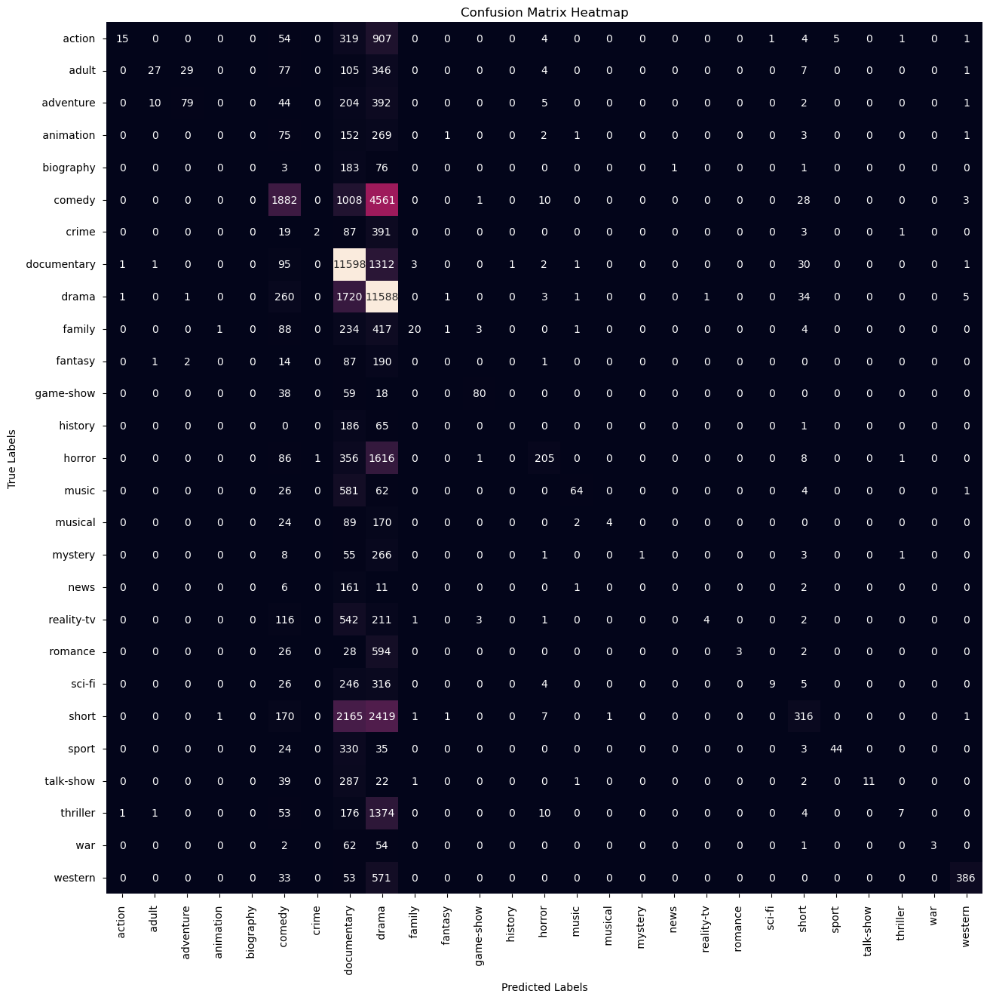

In [52]:
plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False, 
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()